# Congressional District Data

**Note:** *This is an intermediate level notebook aimed at users who already know the basics
of how to download and plot U.S. Census data using `censusdis`.*

Aside from the geogrpahy hierarchy of state-county-tract-block group-block that
is widely used to aggregate census data, there are other geographic hierarchies
like state-congressional district. In this notebook, we will look at how to use
those geographies together even though they don't exist in the same hierarchy.

We will being by downloading some data for congressional districts. We will then
look at how the districts can change over time. We will try to download data about
census tracts within a given congressional district and discover that the U.S. 
Census data model does not really support this. To approximate it, we will attempt
so spatial joins. Finally, we will learn how to use `censusdis.data.contained_within`
to simplify the whole process.

In [1]:
import censusdis.data as ced
import censusdis.maps as cem
from censusdis.states import NJ
from censusdis.datasets import ACS5

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

In [2]:
YEARS = [2020, 2022]

VARIABLE_MEDIAN_HOUSEHOLD_INCOME = "B19013_001E"

## Download Data for Congressional Districts in New Jersey

First, let's download all of the congressional district in New Jersey.
We will do this for both 2020 and 2022, using a pretty standard call to `ced.download`.

In [3]:
# We will get the data for 2020 and 2022.

gdf_nj_districts_by_year = {}

for year in YEARS:
    gdf_nj_districts_by_year[year] = ced.download(
        dataset=ACS5,
        vintage=year,
        download_variables=["NAME"],
        state=NJ,
        congressional_district="*",
        with_geometry=True,
    )

Now we can look at the data. One of the things to notice is that the names of the districts changed. In some
states, the number of districts might have changed. This is because after the 2020 census, seats in congress
were reallocated among the states, and each state redrew its districts to accomodate changes in its population,
or, at times, the politcal whims of their state legislatures.

In [4]:
gdf_nj_districts_by_year[2020]

,STATE,CONGRESSIONAL_DISTRICT,NAME,geometry
0,34,01,"Congressional District 1 (116th Congress), New...","POLYGON ((-75.4283 39.78437, -75.42168 39.7873..."
1,34,02,"Congressional District 2 (116th Congress), New...","POLYGON ((-75.5589 39.62877, -75.55945 39.6298..."
2,34,03,"Congressional District 3 (116th Congress), New...","POLYGON ((-75.03078 39.99323, -75.02883 39.994..."
3,34,04,"Congressional District 4 (116th Congress), New...","POLYGON ((-74.75268 40.19836, -74.75106 40.198..."
4,34,05,"Congressional District 5 (116th Congress), New...","POLYGON ((-75.13552 40.97686, -75.13309 40.980..."
5,34,06,"Congressional District 6 (116th Congress), New...","POLYGON ((-74.51863 40.55624, -74.51125 40.560..."
6,34,07,"Congressional District 7 (116th Congress), New...","POLYGON ((-75.20392 40.6915, -75.20277 40.6945..."
7,34,08,"Congressional District 8 (116th Congress), New...","MULTIPOLYGON (((-74.0422 40.69997, -74.039 40...."
8,34,09,"Congressional District 9 (116th Congress), New...","POLYGON ((-74.20442 40.91875, -74.20274 40.920..."
9,34,10,"Congressional District 10 (116th Congress), Ne...","MULTIPOLYGON (((-74.1306 40.66589, -74.12894 4..."


In [5]:
gdf_nj_districts_by_year[2022]

,STATE,CONGRESSIONAL_DISTRICT,NAME,geometry
0,34,01,"Congressional District 1 (118th Congress), New...","POLYGON ((-75.26018 39.81259, -75.25107 39.818..."
1,34,02,"Congressional District 2 (118th Congress), New...","POLYGON ((-75.5589 39.62877, -75.55945 39.6298..."
2,34,03,"Congressional District 3 (118th Congress), New...","POLYGON ((-75.03078 39.99323, -75.0275 39.9947..."
3,34,04,"Congressional District 4 (118th Congress), New...","POLYGON ((-74.5531 40.07913, -74.53347 40.0874..."
4,34,05,"Congressional District 5 (118th Congress), New...","POLYGON ((-74.8722 41.20132, -74.86729 41.2087..."
5,34,06,"Congressional District 6 (118th Congress), New...","POLYGON ((-74.51863 40.55624, -74.51125 40.560..."
6,34,07,"Congressional District 7 (118th Congress), New...","POLYGON ((-75.20392 40.6915, -75.20277 40.6945..."
7,34,08,"Congressional District 8 (118th Congress), New...","MULTIPOLYGON (((-74.0422 40.69997, -74.039 40...."
8,34,09,"Congressional District 9 (118th Congress), New...","POLYGON ((-74.30236 41.01308, -74.29654 41.013..."
9,34,10,"Congressional District 10 (118th Congress), Ne...","MULTIPOLYGON (((-74.10815 40.71596, -74.10563 ..."


## Plot the Congressional Districts

If we plot the congressional districts on a map as they were drawn in 2020 and again in 2022, we will
see that they changed.

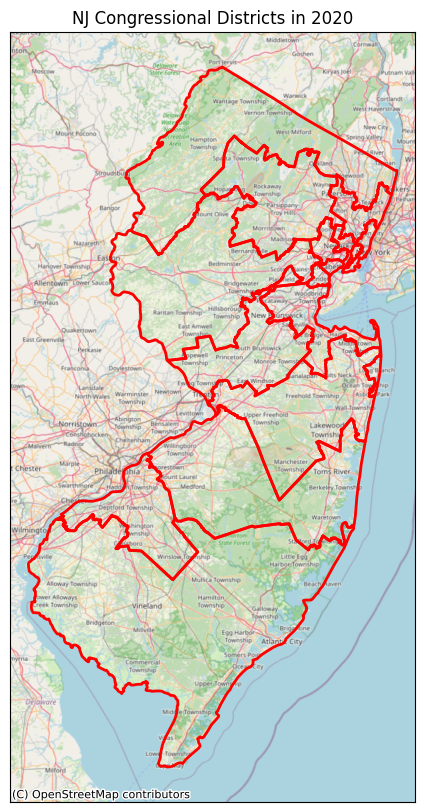

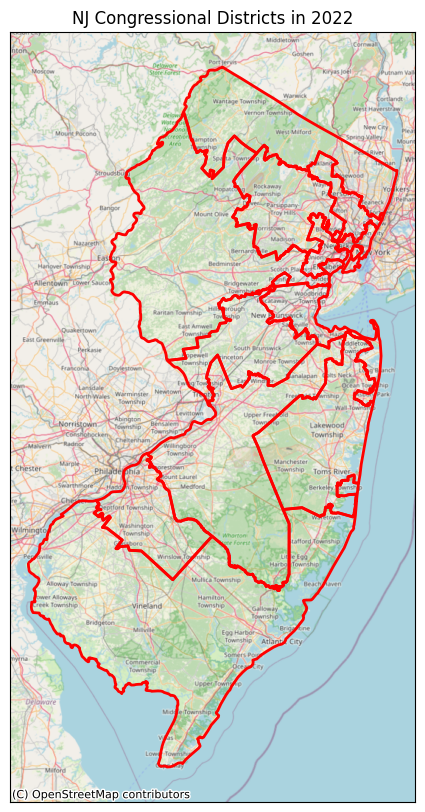

In [6]:
for year in YEARS:
    ax = cem.plot_map(
        gdf_nj_districts_by_year[year].boundary,
        linewidth=2,
        color="red",
        with_background=True,
        figsize=(8, 10),
    )
    ax.set_title(f"NJ Congressional Districts in {year}")

## Tracts within Congressional Districts

Often we don't just want to get data on a congressional district as a whole, but
on smaller areas within it, like census tracts.

One way we might try to do that is with something like

```python
ced.download(
    dataset=ACS5,
    vintage=2020,
    download_variables=['NAME', VARIABLE_MEDIAN_HOUSEHOLD_INCOME],
    state=NJ,
    congressional_district="11",
    tract="*"
)
```

Unfortunately, this does not work. The reason is that, according to the way the U.S. Census
organizes geography hierarchies, tracts do not exist within congressional districts. Instead,
they exist within counties. `censusdis` will tell us this by raising an exception if we run the
code above. This exception gives us a helpful list of valid geographies.

In [7]:
try:
    ced.download(
        dataset=ACS5,
        vintage=2020,
        download_variables=["NAME", VARIABLE_MEDIAN_HOUSEHOLD_INCOME],
        state=NJ,
        congressional_district="11",
        tract="*",
    )
except ced.CensusApiException as e:
    print(e)

The following args are not recognized as non-geographic arguments or goegraphic arguments for the dataset acs/acs5 in vintage 2020: congressional district.
Sometimes this can be due to spelling errors in argument names.
Supported geographies for dataset='acs/acs5' in year=2020 are:
['us']
['region']
['division']
['state']
['state', 'county']
['state', 'county', 'county_subdivision']
['state', 'county', 'county_subdivision', 'subminor_civil_division']
['state', 'county', 'county_subdivision', 'place_remainder_or_part']
['state', 'county', 'tract']
['state', 'county', 'tract', 'block_group']
['state', 'place', 'county_or_part']
['state', 'place']
['state', 'consolidated_city']
['state', 'consolidated_city', 'place_or_part']
['state', 'alaska_native_regional_corporation']
['american_indian_area_alaska_native_area_hawaiian_home_land']
['american_indian_area_alaska_native_area_hawaiian_home_land', 'tribal_subdivision_remainder']
['american_indian_area_alaska_native_area_reservation_or_stati

If you look at the error message in the last cell, you will see that the only valid geographies that 
contain `congressional_distrct` are 
`['state', 'congressional_district']`,
`['state', 'congressional_district', 'county_or_part']`,
and
`['state', 'congressional_district', 'american_indian_area_alaska_native_area_hawaiian_home_land_or_part']`.

The only places `tract` appears are in 
`['state', 'county', 'tract']`
and
`['state', 'county', 'tract', 'block_group']`.

These are the only kinds of queries the U.S. Census API behind `censusdis` supports, so it looks like we might
be out of luck.

But before we give up entirely, let's take a visual look at what is going on. We'll do that 
by downloading census tract data and plotting it along with our congressional districts.

## Download Census Tracts

We know we can't directly download the tracts within congressional districts, but we can
download the tracts within counties.

In [8]:
gdf_nj_tracts_by_year = {}

for year in YEARS:
    gdf_nj_tracts_by_year[year] = ced.download(
        dataset=ACS5,
        vintage=year,
        download_variables=["NAME"],
        state=NJ,
        county="*",
        tract="*",
        with_geometry=True,
    )

## Plot the Congressional Districts and Census Tracts Together

This will help us visually see the relationship between congressional districts and census tracts.

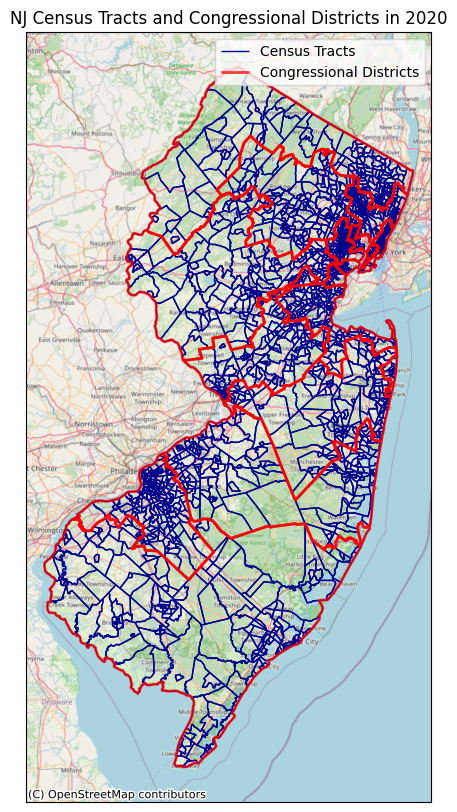

In [9]:
for year in YEARS[:1]:
    ax = cem.plot_map(
        gdf_nj_tracts_by_year[year].boundary,
        label="Census Tracts",
        linewidth=1,
        color="darkblue",
        with_background=True,
        figsize=(6, 10),
    )
    ax = cem.plot_map(
        gdf_nj_districts_by_year[year].boundary,
        label="Congressional Districts",
        linewidth=2,
        color="red",
        alpha=0.75,
        ax=ax,
    )
    ax.set_title(f"NJ Census Tracts and Congressional Districts in {year}")
    ax.legend()

## Spatial Joins

One of the ways we could solve our problem is to take the two data sets we have, one for 
congressional districts and the other for census tracts and do a spatial join on them.
Both of the data sets are in `gpd.GeoDataFrame`s, so we could us `gpd.GeoDataFrame.sjoin()`
to do this.

Let's give that a try. We'll zoom into just the 11th congressional district to make the 
resulting maps a little easier to interpret. We will also fill in the tracts with a light
blue color to make it very clear what area they cover and
don't cover. 

In [10]:
gdf_district_11_2020 = gdf_nj_districts_by_year[2020]
gdf_district_11_2020 = gdf_district_11_2020[
    gdf_district_11_2020["CONGRESSIONAL_DISTRICT"] == "11"
]

In [11]:
gdf_district_11_2020_tracts = gdf_nj_tracts_by_year[2020].sjoin(gdf_district_11_2020)

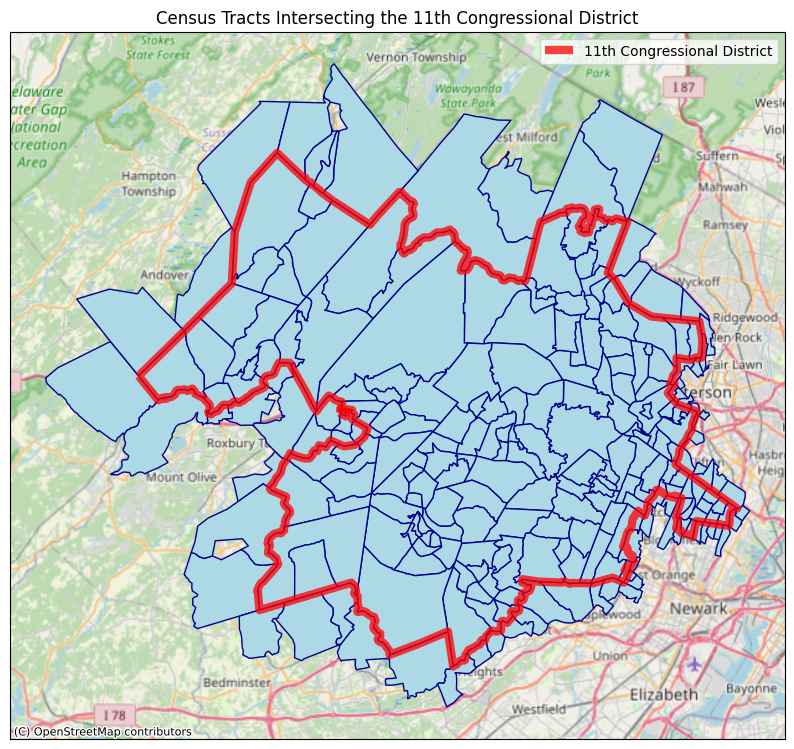

In [12]:
ax = cem.plot_map(
    gdf_district_11_2020_tracts,
    linewidth=1,
    color="lightblue",
    edgecolor="darkblue",
    legend=False,
    with_background=True,
    figsize=(10, 10),
)

ax = cem.plot_map(
    gdf_district_11_2020.boundary,
    label="11th Congressional District",
    linewidth=6,
    color="red",
    alpha=0.75,
    ax=ax,
)

ax.set_title(f"Census Tracts Intersecting the 11th Congressional District")
_ = ax.legend()

### What Happened?

The map above shows census tracts that are clearly outside the 11th congressional district? How 
did this happen?

The answer is that the tracts that look like they are outsize of the congressional district do
actually intersect it out the boundary. Since the default predicate for `gpd.sjoin` is `'intersects'`,
any intersection at all counts, so the tracts that just intersect at the boundaries get 
included.

So maybe we just have to change predicates. Instead of tracts that intersect the congressional
district, we want tracts that are *within* the congressional district. Let's give that a try.

### Spatial Joining Tracts Within a Congressional District

In [13]:
gdf_district_11_2020_tracts_within = gdf_nj_tracts_by_year[2020].sjoin(
    gdf_district_11_2020, predicate="within"
)

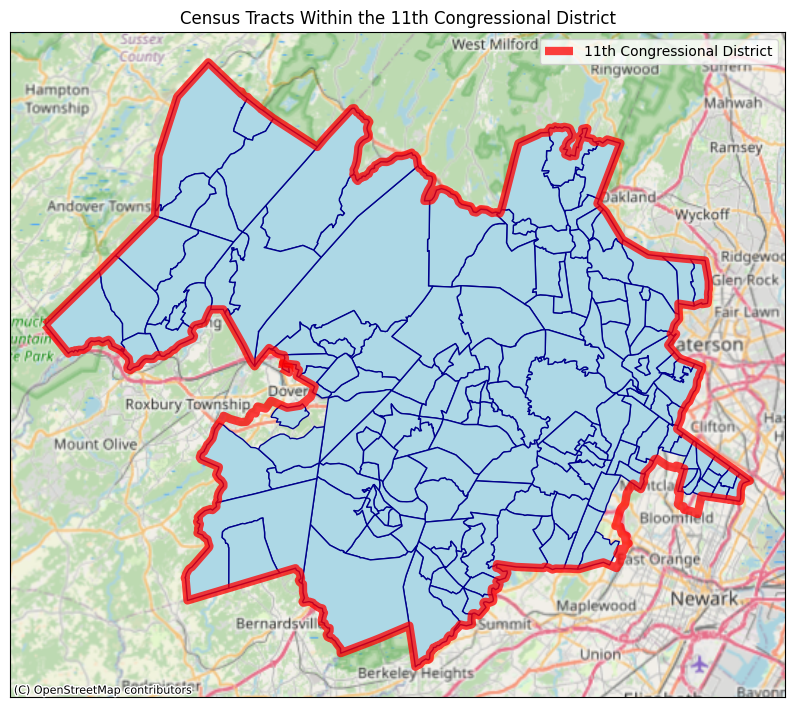

In [14]:
ax = cem.plot_map(
    gdf_district_11_2020_tracts_within,
    linewidth=1,
    color="lightblue",
    edgecolor="darkblue",
    legend=False,
    with_background=True,
    figsize=(10, 10),
)

ax = cem.plot_map(
    gdf_district_11_2020.boundary,
    label="11th Congressional District",
    linewidth=6,
    color="red",
    alpha=0.75,
    ax=ax,
)

ax.set_title(f"Census Tracts Within the 11th Congressional District")
_ = ax.legend()

It looks like we got things mostly right, but there are a few problems at the
margins. In the area near Dover, some of the background inside the congressional district shows
through. The same is the case near East Orange.

### What Happened?

The issue we have here is sort of the mirror of the problem we had with the intersecting spatial
join. But in this case, there were a handful of tracts that were not *entirely within* the 
congressional district. This can happen for two reasons:

1. congressional district boundaries don't always exactly follow census tract boundaries;
1. there were small discrepencies in the maps files `censusdis` downloaded for the 
   different geography levels.

When we did the geometric calculation to determing containment, we got it wrong for one of these
reasons.

In order to get around this problem, we need something a little better than strict containment.
We need to be able to ask for the tracts that are alomost completely inside the congressional
district, except for a bit of area at the edges, due to the kind of errors we
just saw. So we really want to do something like find all tracts for which 80% or more of
their area is withing the congressional district.

`censusdis.maps.sjoin_mostly_contains` is a function that does this. We could go down that road
and demonstrate how to use it to solve our problem, but now we are getting to the point where we
really have to write a lot of fairly delicate code to get things right. Luckily, there is an easier
way, which does all of this work for us, behind the function `ced.contained_within`. Let's take a
look at how it works.

## Querying Geometries within Other Geometires with `ced.contained_within` 

The approach we are going to use to get the census tracts that we actually want
is to do a two-part query. The first, using `ced.contained_within`, tells us the
larger geographies we are interested in. In this case, that's congressional districts
in New Jersey.

The second part of the query looks like the `download` method we are used to. The key is 
thay by chaining them. we are saying we only want the results of the `download` query that 
are contained within one of the geometries of the `contained_within` query.

All of the intersection and area checking we were worried about having to do are hidden
behind this simple API so that we don't have to keep redoing it manually every time we 
want to query data from one geometry contained within another in a way that is not 
directly compatible with the geography hierarches the U.S. Census provides.

In [15]:
gdf_district_tracts_by_year = {}

for year in YEARS:
    gdf_district_tracts_by_year[year] = ced.contained_within(
        area_threshold=0.8,  # This is the default value.
        state=NJ,
        congressional_district="*",
    ).download(
        ACS5,
        year,
        download_variables=["NAME", VARIABLE_MEDIAN_HOUSEHOLD_INCOME],
        state=NJ,
        tract="*",
        with_geometry=True,
    )

If we look at the results, we see that the data is joined as we would expect, and it contains columns for the
congressional district, county, and tract for each row even though those originally came from different geographies.

In [16]:
gdf_district_tracts_by_year[2022]

,STATE,CONGRESSIONAL_DISTRICT,COUNTY,TRACT,NAME,B19013_001E,geometry
0,34,02,001,000100,Census Tract 1; Atlantic County; New Jersey,44091.0,"POLYGON ((-74.46816 39.36092, -74.46465 39.360..."
1,34,02,001,000200,Census Tract 2; Atlantic County; New Jersey,50020.0,"POLYGON ((-74.46781 39.34745, -74.46588 39.348..."
2,34,02,001,000300,Census Tract 3; Atlantic County; New Jersey,50663.0,"POLYGON ((-74.46079 39.35222, -74.45794 39.353..."
3,34,02,001,000400,Census Tract 4; Atlantic County; New Jersey,33966.0,"POLYGON ((-74.45702 39.35039, -74.45507 39.351..."
4,34,02,001,000500,Census Tract 5; Atlantic County; New Jersey,48750.0,"POLYGON ((-74.45174 39.35901, -74.44999 39.360..."
...,...,...,...,...,...,...,...
2140,34,07,041,032101,Census Tract 321.01; Warren County; New Jersey,121193.0,"POLYGON ((-75.10324 40.71943, -75.04205 40.768..."
2141,34,07,041,032102,Census Tract 321.02; Warren County; New Jersey,168145.0,"POLYGON ((-75.14738 40.69002, -75.14136 40.694..."
2142,34,07,041,032200,Census Tract 322; Warren County; New Jersey,91954.0,"POLYGON ((-75.19811 40.70654, -75.19442 40.714..."
2143,34,07,041,032300,Census Tract 323; Warren County; New Jersey,98264.0,"POLYGON ((-75.20181 40.61719, -75.2011 40.6179..."


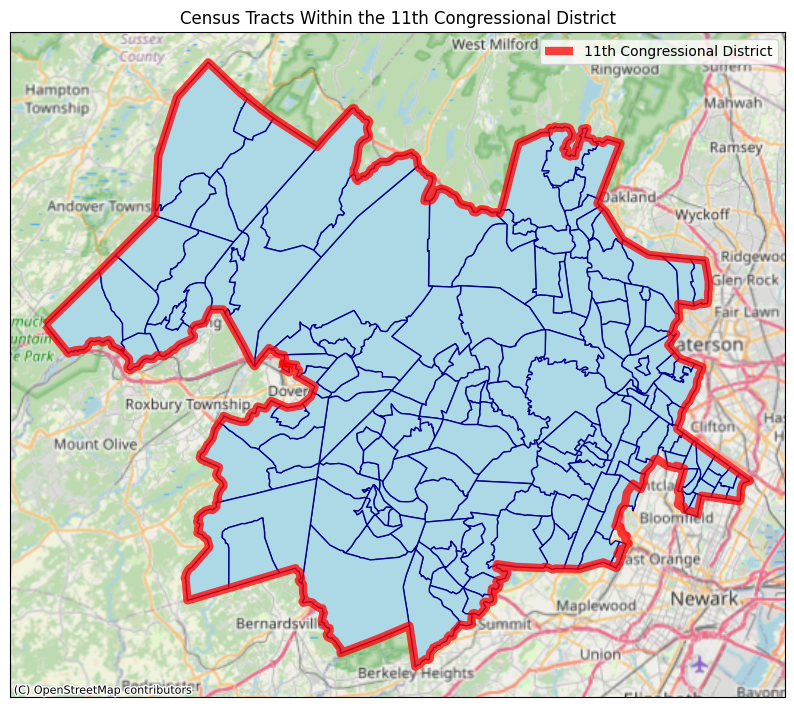

In [17]:
gdf_district_11_2020_tracts_contained_within = gdf_district_tracts_by_year[2020]
gdf_district_11_2020_tracts_contained_within = (
    gdf_district_11_2020_tracts_contained_within[
        gdf_district_11_2020_tracts_contained_within["CONGRESSIONAL_DISTRICT"] == "11"
    ]
)

ax = cem.plot_map(
    gdf_district_11_2020_tracts_contained_within,
    linewidth=1,
    color="lightblue",
    edgecolor="darkblue",
    legend=False,
    with_background=True,
    figsize=(10, 10),
)

ax = cem.plot_map(
    gdf_district_11_2020.boundary,
    label="11th Congressional District",
    linewidth=6,
    color="red",
    alpha=0.75,
    ax=ax,
)

ax.set_title(f"Census Tracts Within the 11th Congressional District")
_ = ax.legend()

There are still some small artifacts where the
boundary of the congressional district appears to cut through a census tract. We can tune those
by adjusting the `area_threshold=` argument up or down from the default of 0.8.

## Zoom in to Districts 10 and 11

Among others, districts 10 and 11 changed significantly from 2020 to 2022.
We can zoom into them to see that.

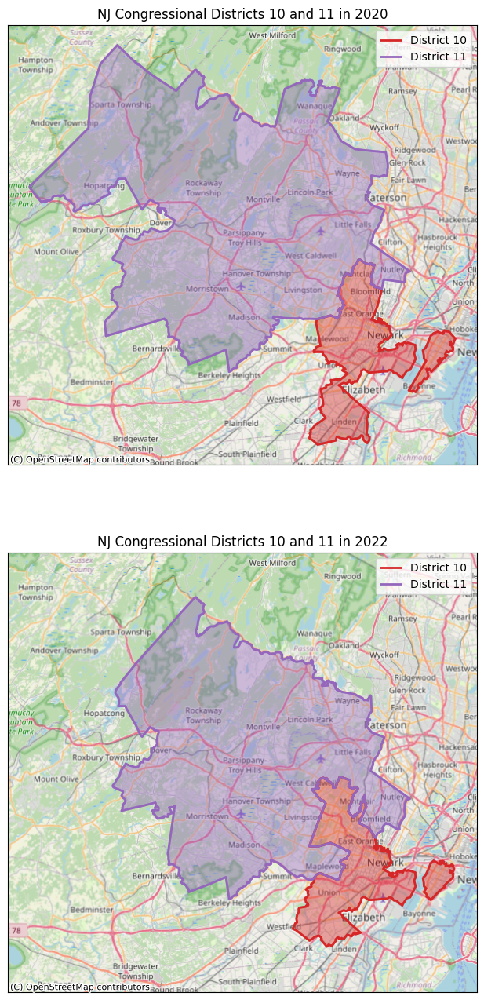

In [18]:
DISTRICTS = ["10", "11"]

fig, axes = plt.subplots(len(YEARS), 1, figsize=(8, 16), sharex=True, sharey=True)

for year, ax in zip(YEARS, axes):
    gdf_districts = gdf_nj_districts_by_year[year][
        gdf_nj_districts_by_year[year]["CONGRESSIONAL_DISTRICT"].isin(DISTRICTS)
    ]
    colors = gdf_districts["CONGRESSIONAL_DISTRICT"].apply(
        lambda d: f"C{3 + int(d) - int(DISTRICTS[0])}"
    )
    ax = cem.plot_map(
        gdf_districts,
        linewidth=2,
        edgecolor=colors,
        color=colors,
        alpha=0.4,
        with_background=True,
        ax=ax,
    )
    for ii, district in enumerate(DISTRICTS):
        ax = cem.plot_map(
            gdf_districts[gdf_districts["CONGRESSIONAL_DISTRICT"] == district].boundary,
            label=f"District {int(district)}",
            linewidth=2,
            color=f"C{3 + ii}",
            ax=ax,
        )
    ax.set_title(f"NJ Congressional Districts 10 and 11 in {year}")
    ax.legend()

## Median Income in Tracts Gained and Lost From 2020 to 2022

We might have gone a little backwards relative to a typical workflow in that we 
talked all about different ways of getting data about tracts in congressional
districts before we actually posed a research problem. But let's correct that
now and show what kinds of questions we can answer.

The maps directly above show that the boundary between the 10th and 11th
districts changed quite a bit. Suppose we'd like to know whether the people
who in one district and are now in the other were primarily high income 
people, low income people, or a mix.

The way we are going to answer this question is by producing maps showing
the 2020 median income of tracts that were in the 10th district, along with
the outline of tracts that were in not in the 10th district in 2020 but
were in 2022. We'll also create the opposite map, showing the 
2022 median income of tracts that were in the 10th district, along with
the outline of tracts that were in not in the 10th district in 2022 but
were in 2020. 

In [19]:
# In order to be able to plot nice maps with all the tracts that are in
# a given district in either year, we have to do a little fancy merging and
# cleaning up.

gdf_all_tracts_by_district = {}

for district in DISTRICTS:
    gdf_all_tracts_for_district = gdf_district_tracts_by_year[YEARS[0]][
        ["CONGRESSIONAL_DISTRICT", "COUNTY", "TRACT", "geometry"]
    ]
    gdf_all_tracts_for_district = gdf_all_tracts_for_district[
        gdf_all_tracts_for_district["CONGRESSIONAL_DISTRICT"] == district
    ]

    for year in YEARS[1:]:
        gdf_next_year = gdf_district_tracts_by_year[year][
            ["CONGRESSIONAL_DISTRICT", "COUNTY", "TRACT", "geometry"]
        ]
        gdf_next_year = gdf_next_year[
            gdf_next_year["CONGRESSIONAL_DISTRICT"] == district
        ]

        gdf_all_tracts_for_district = gdf_all_tracts_for_district.merge(
            gdf_next_year,
            how="outer",
            on=["CONGRESSIONAL_DISTRICT", "COUNTY", "TRACT"],
        )
        gdf_all_tracts_for_district["geometry"] = gdf_all_tracts_for_district[
            "geometry_x"
        ]
        gdf_all_tracts_for_district["geometry"][
            gdf_all_tracts_for_district["geometry"].isna()
        ] = gdf_all_tracts_for_district["geometry_y"][
            gdf_all_tracts_for_district["geometry"].isna()
        ]
        gdf_all_tracts_for_district = gdf_all_tracts_for_district[
            ["CONGRESSIONAL_DISTRICT", "COUNTY", "TRACT", "geometry"]
        ]

    gdf_all_tracts_for_district = gpd.GeoDataFrame(gdf_all_tracts_for_district)

    gdf_all_tracts_by_district[district] = gdf_all_tracts_for_district

/var/folders/78/t8hxf7gn23543dfqt1z2m2d00000gn/T/ipykernel_99207/2830792136.py:31: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  gdf_all_tracts_for_district["geometry"][
/var/folders/78/t8hxf7gn23543dfqt1z2m2d00000gn/T/ipykernel_99207/283079

In [20]:
# Put all the tracts together in one GeoDataFrame.
# We only really need this for plotting, so we can
# plot data for one year over a backround of outlines
# of tracts that were not present in that year.


def _add_year(df: pd.DataFrame, year: int) -> pd.DataFrame:
    df["YEAR"] = year
    return df


gdf_all_tracts_all_years = gpd.GeoDataFrame(
    pd.concat(_add_year(gdf_district_tracts_by_year[year], year) for year in YEARS)
)

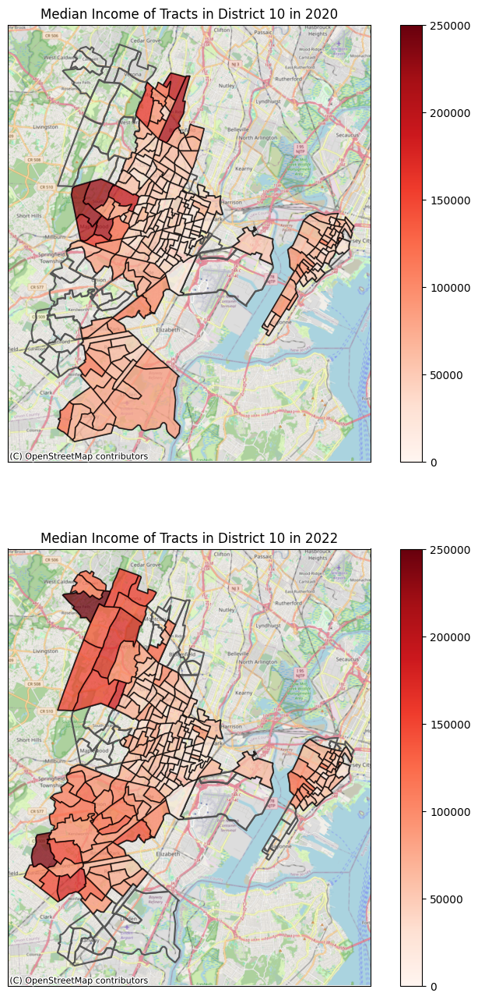

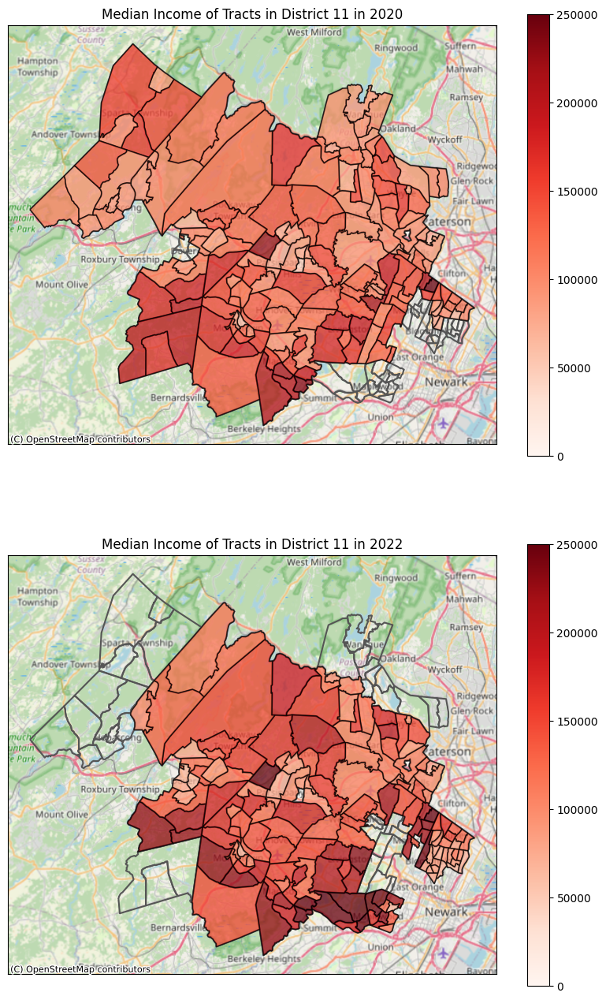

In [21]:
for district in DISTRICTS:
    fig, axes = plt.subplots(
        len(YEARS), 1, figsize=(10, 16), sharex="row", sharey="row"
    )

    for year, ax in zip(YEARS, axes):
        gdf = gdf_district_tracts_by_year[year]
        gdf = gdf[gdf["CONGRESSIONAL_DISTRICT"] == district]
        ax = cem.plot_map(
            gdf_all_tracts_all_years[
                gdf_all_tracts_all_years["CONGRESSIONAL_DISTRICT"] == district
            ].boundary,
            color="#555555",
            with_background=True,
            ax=ax,
            zorder=1,
        )
        ax = cem.plot_map(
            gdf,
            VARIABLE_MEDIAN_HOUSEHOLD_INCOME,
            cmap="Reds",
            edgecolor="black",
            alpha=0.75,
            vmin=0,
            vmax=250_000,
            legend=True,
            ax=ax,
            zorder=2,
        )
        ax.set_title(f"Median Income of Tracts in District {district} in {year}")

Each of the maps shows the median income of each tract in a given congressional
district in a shade of red. They also outline but don't fill in tracts that were
not in the district that year (2020 or 2022) but were in the other year (2022 or 2020 respectively).
This let's us visually identify tracts that moved districts and what kind of median
income they had.

What we see in these maps is that there was a cluster of high-income tracts at the center left of the map 
that were in district 10 in 2020 but not in 2022. Directly to the north and south of these tracts are 
other medium to high income tracts that were not in the district 10 in 2020 but were added for 2022.
Similarly, some high income tracts at the northern end of district 10 in 2020 were removed in 2022.
Looking at the district 11 maps, we see that that is where the high-income tracts that were
removed from district 10 ended up. They replaced the tracts that made up the northwest corner of district 11
in 2020 but were removed in 2022.